In [1]:
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import networkx as nx
import osmnx as ox
import pandas as pd
import geopandas as gpd
import folium
import contextily as cx

%matplotlib inline
ox.config(log_console=True, use_cache=True)
ox.__version__

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\osmnx\utils.py:192: UserWarning: The `utils.config` function is deprecated and will be removed in a future release. Instead, use the `settings` module directly to configure a global setting's value. For example, `ox.settings.log_console=True`.
  warnings.warn(


'1.3.1.post0'

---
## MALI

motorway, motorway link, trunk and trunk link

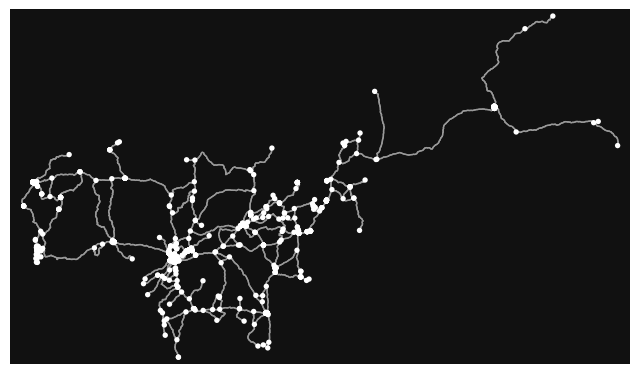

In [2]:
G = ox.load_graphml('./data/Mali_allroads.graphml')
fig, ax = ox.plot_graph(G)

In [3]:
H = ox.get_undirected(G)

In [4]:
print(nx.is_connected(H))

True


In [5]:
map = ox.folium.plot_graph_folium(G)
map

## Graph Features

In [6]:
nx.degree_histogram(G)

[0, 35, 69, 512, 307, 85, 195, 0, 11]

In [7]:
nx.density(G)

0.0015686732555470595

In [8]:
nx.is_directed(G)

True

In [9]:
nx.number_of_nodes(G)

1214

In [10]:
nx.number_of_edges(G)

2310

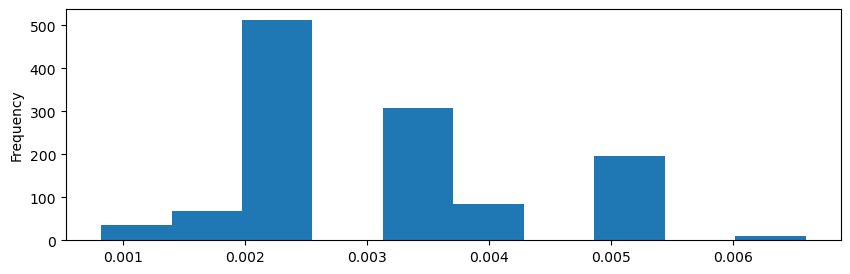

In [11]:
nc = pd.Series(
    nx.degree_centrality(G)
)
nc.plot.hist(bins=10, figsize=(10, 3));


In [12]:
nx.diameter(H)

83

In [13]:
nx.average_shortest_path_length(H)

28.834090054068298

In [ ]:
nx.average_node_connectivity(H)

In [61]:
stats = ox.basic_stats(G)
stats

{'n': 1214,
 'm': 2310,
 'k_avg': 3.8056013179571666,
 'edge_length_total': 23971862.781000014,
 'edge_length_avg': 10377.429775324681,
 'streets_per_node_avg': 2.8945634266886326,
 'streets_per_node_counts': {0: 0, 1: 100, 2: 37, 3: 969, 4: 107, 5: 1},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.08237232289950576,
  2: 0.030477759472817133,
  3: 0.7981878088962109,
  4: 0.08813838550247118,
  5: 0.0008237232289950577},
 'intersection_count': 1114,
 'street_length_total': 12186858.965000011,
 'street_segment_count': 1759,
 'street_length_avg': 6928.288212052309,
 'circuity_avg': 1.147658416401448,
 'self_loop_proportion': 0.0}

In [62]:
stats = ox.basic_stats(H)
stats

{'n': 1214,
 'm': 1759,
 'k_avg': 2.897858319604613,
 'edge_length_total': 12186858.965000011,
 'edge_length_avg': 6928.288212052309,
 'streets_per_node_avg': 2.8945634266886326,
 'streets_per_node_counts': {0: 0, 1: 100, 2: 37, 3: 969, 4: 107, 5: 1},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.08237232289950576,
  2: 0.030477759472817133,
  3: 0.7981878088962109,
  4: 0.08813838550247118,
  5: 0.0008237232289950577},
 'intersection_count': 1114,
 'street_length_total': 12186858.965000011,
 'street_segment_count': 1759,
 'street_length_avg': 6928.288212052309,
 'circuity_avg': 1.147658416401448,
 'self_loop_proportion': 0.0}

## Graph centralities

Closeness centrality directed graph

In [14]:
# node closeness centrality
node_closcentrality = nx.closeness_centrality(G)

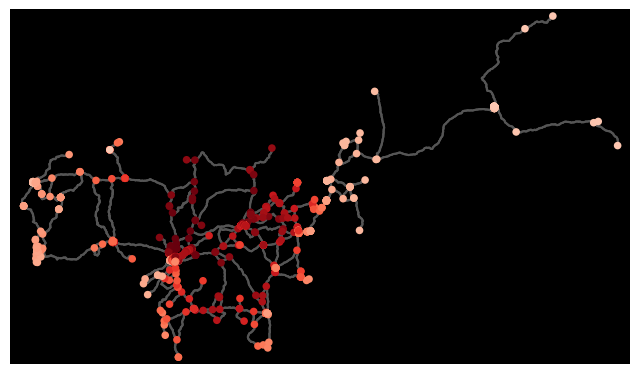

In [15]:
# plot it
df = pd.DataFrame(data=pd.Series(node_closcentrality).sort_values(), columns=['cc'])
df['colors'] = ox.plot.get_colors(n=len(df), cmap='Reds', start=0.2)
df = df.reindex(G.nodes())
nc = df['colors'].tolist()
fig, ax = ox.plot_graph(G, bgcolor='k', node_size=30, node_color=nc, node_edgecolor='none', node_zorder=2,
                        edge_color='#555555', edge_linewidth=1.5, edge_alpha=1)

Betweenness centrality

In [16]:
node_betwcentrality = nx.betweenness_centrality(G)

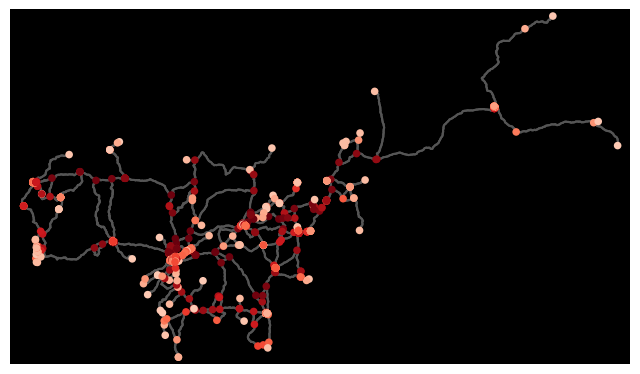

In [17]:
# plot it
df = pd.DataFrame(data=pd.Series(node_betwcentrality).sort_values(), columns=['cc'])
df['colors'] = ox.plot.get_colors(n=len(df), cmap='Reds', start=0.2)
df = df.reindex(G.nodes())
nc = df['colors'].tolist()
fig, ax = ox.plot_graph(G, bgcolor='k', node_size=30, node_color=nc, node_edgecolor='none', node_zorder=2,
                        edge_color='#555555', edge_linewidth=1.5, edge_alpha=1)

Edge betweenness centrality

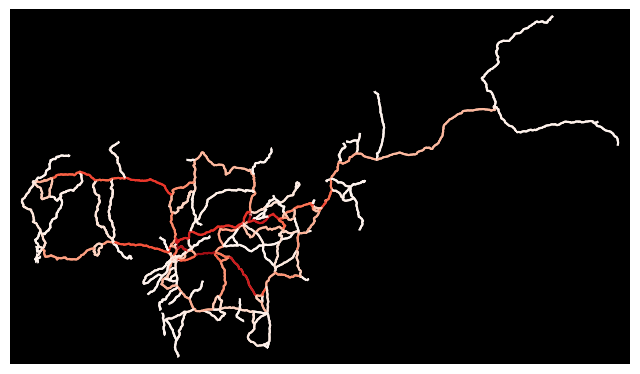

In [132]:
# edge closeness centrality: convert graph to a line graph so edges become nodes and vice versa
edge_betwcentrality = nx.betweenness_centrality(nx.line_graph(G))

# list of edge values for the original graph
ev = [edge_betwcentrality[edge + (0,)] for edge in G.edges()]

# color scale converted to list of colors for graph edges
norm = colors.Normalize(vmin=min(ev)*0.8, vmax=max(ev))
cmap = cm.ScalarMappable(norm=norm, cmap=cm.Reds)
ec = [cmap.to_rgba(cl) for cl in ev]

# color the edges in the original graph with closeness centralities in the line graph
fig, ax = ox.plot_graph(G, bgcolor='k', node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=ec, edge_linewidth=1.5, edge_alpha=1)

Undirected graph: TO DO does not work

In [19]:
# edge closeness centrality: convert graph to a line graph so edges become nodes and vice versa
edge_betwcentralityH = nx.betweenness_centrality(nx.line_graph(H))

# list of edge values for the original graph
ev = [edge_betwcentralityH[edge + (0,)] for edge in H.edges()]

# color scale converted to list of colors for graph edges
norm = colors.Normalize(vmin=min(ev)*0.8, vmax=max(ev))
cmap = cm.ScalarMappable(norm=norm, cmap=cm.Reds)
ec = [cmap.to_rgba(cl) for cl in ev]

# color the edges in the original graph with closeness centralities in the line graph
fig, ax = ox.plot_graph(H, bgcolor='0.3', node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=ec, edge_linewidth=1.5, edge_alpha=1)

KeyError: (1622805365, 5491723077, 0)

In [ ]:
# save a shapefile with centrality as node and edge attributes
nx.set_node_attributes(G, node_centrality, 'node_centrality')
nx.set_edge_attributes(G, edge_betwcentrality, 'edge_centrality')
ox.save_graph_shapefile(G)


In [ ]:
#Tried to map it down with labels, but apparently there are none :)
nx.draw_networkx(G, with_label = True)

## Find edge attributes

In [68]:
edge_attributes = ox.graph_to_gdfs(G, nodes=False).columns
print(edge_attributes)

Index(['osmid', 'highway', 'oneway', 'reversed', 'length', 'bridge',
       'geometry', 'ref', 'name', 'lanes', 'junction', 'maxspeed', 'access',
       'width'],
      dtype='object')


In [22]:
edge_attributes

Index(['osmid', 'highway', 'oneway', 'reversed', 'length', 'bridge',
       'geometry', 'ref', 'name', 'lanes', 'junction', 'maxspeed', 'access',
       'width'],
      dtype='object')

Get gdfs of nodes and edges

In [69]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)
gdf_nodes

,y,x,street_count,population,highway,geometry
osmid,,,,,,
504509824,11.145851,-6.913822,3,1,NaN,POINT (-6.91382 11.14585)
2456393854,11.402407,-7.019849,3,1,NaN,POINT (-7.01985 11.40241)
2534916634,11.409864,-6.842530,4,1,NaN,POINT (-6.84253 11.40986)
2148961035,11.712846,-6.848868,3,1,NaN,POINT (-6.84887 11.71285)
2148961095,11.726344,-6.879205,3,1,NaN,POINT (-6.87921 11.72634)
...,...,...,...,...,...,...
10934163649,14.459957,-11.388939,3,1,NaN,POINT (-11.38894 14.45996)
10934163651,14.459775,-11.388792,3,1,NaN,POINT (-11.38879 14.45978)
10934163656,14.459922,-11.388554,3,1,NaN,POINT (-11.38855 14.45992)


In [24]:
gdf_edges

osmid  \
u           v           key                                                      
504509824   505824314   0           [41268816, 214787226, 41269211, 214787218]   
            2534916634  0    [894523660, 630217423, 246447439, 246447443, 4...   
2456393854  505824314   0    [572191905, 572191906, 321956592, 321956593, 3...   
            2534916634  0                    [572191817, 572205562, 339539188]   
            2148961095  0    [582062498, 582062499, 582062302, 423677690, 5...   
...                                                                        ...   
10934163656 10934163644 0                             [1176934609, 1177989765]   
            10934163638 0                                           1176934610   
10934163665 10934163672 0                                           1176934609   
            10934163636 0                                           1176934611   
10934163672 10934163649 0                                           1176934609   

                               highway  oneway       reversed     length  \
u           v           key                                                
504509824   505824314   0      primary   False           True  48681.697   
            2534916634  0    secondary   False  [False, True]  53546.744   
2456393854  505824314   0        trunk   False          False  25790.558   
            2534916634  0        trunk   False           True  19797.290   
            2148961095  0    secondary   False  [False, True]  42692.201   
...                                ...     ...            ...        ...   
10934163656 10934163644 0        trunk    True          False     34.313   
            10934163638 0        trunk    True          False     49.446   
10934163665 10934163672 0        trunk    True          False     29.173   
            10934163636 0        trunk    True          False     49.562   
10934163672 10934163649 0        trunk    True          False      2.840   

                            bridge  \
u           v           key          
504509824   505824314   0      yes   
            2534916634  0      NaN   
2456393854  505824314   0      yes   
            2534916634  0      yes   
            2148961095  0      yes   
...                            ...   
10934163656 10934163644 0      NaN   
            10934163638 0      NaN   
10934163665 10934163672 0      NaN   
            10934163636 0      NaN   
10934163672 10934163649 0      NaN   

                                                                      geometry  \
u           v           key                                                      
504509824   505824314   0    LINESTRING (-6.91382 11.14585, -6.91359 11.153...   
            2534916634  0    LINESTRING (-6.91382 11.14585, -6.91070 11.146...   
2456393854  505824314   0    LINESTRING (-7.01985 11.40241, -7.02066 11.402...   
            2534916634  0    LINESTRING (-7.01985 11.40241, -7.01851 11.402...   
            2148961095  0    LINESTRING (-7.01985 11.40241, -7.01965 11.403...   
...                                                                        ...   
10934163656 10934163644 0    LINESTRING (-11.38855 14.45992, -11.38855 14.4...   
            10934163638 0    LINESTRING (-11.38855 14.45992, -11.38852 14.4...   
10934163665 10934163672 0    LINESTRING (-11.38875 14.46014, -11.38879 14.4...   
            10934163636 0    LINESTRING (-11.38875 14.46014, -11.38885 14.4...   
10934163672 10934163649 0    LINESTRING (-11.38894 14.45998, -11.38894 14.4...   

                              ref  \
u           v           key         
504509824   505824314   0     NaN   
            2534916634  0    RN30   
2456393854  505824314   0     RN7   
            2534916634  0     RN7   
            2148961095  0     NaN   
...                           ...   
10934163656 10934163644 0     NaN   
            10934163638 0     NaN   
10934163665 10934163672 0     NaN   
            10934163636 0     NaN   
10934163672

In [25]:
gdf_nodes.to_csv("nodes.csv")


---
### Populations

source: https://simplemaps.com/data/ml-cities

In [26]:
Malipopulations = pd.read_csv('Malipopulations.csv')
Malipopulations.head()

,city,lat,lng,country,iso2,admin_name,capital,population,population_proper
0,Bamako,12.6458,-7.9922,Mali,ML,Bamako,primary,2009109.0,2009109.0
1,Balandougou,13.3558,-9.5517,Mali,ML,Kayes,NaN,1596882.0,1596882.0
2,Sikasso,11.3167,-5.6667,Mali,ML,Sikasso,admin,213977.0,213977.0
3,Ségou,13.4500,-6.2667,Mali,ML,Ségou,admin,133501.0,133501.0
4,Mopti,14.4900,-4.1800,Mali,ML,Mopti,admin,108456.0,108456.0


In [27]:
#Drop irrelevant information
Malipopulations = Malipopulations.drop(['population_proper', 'capital','iso2', 'country'], axis=1)

In [28]:
gdfMalipopulations = gpd.GeoDataFrame(Malipopulations, geometry=gpd.points_from_xy(Malipopulations.lng, Malipopulations.lat), crs="EPSG:4326")

In [29]:
#Drop the NAn values. 
cleangdfMalipop = gdfMalipopulations.dropna()
cleangdfMalipop

,city,lat,lng,admin_name,population,geometry
0,Bamako,12.6458,-7.9922,Bamako,2009109.0,POINT (-7.99220 12.64580)
1,Balandougou,13.3558,-9.5517,Kayes,1596882.0,POINT (-9.55170 13.35580)
2,Sikasso,11.3167,-5.6667,Sikasso,213977.0,POINT (-5.66670 11.31670)
3,Ségou,13.4500,-6.2667,Ségou,133501.0,POINT (-6.26670 13.45000)
4,Mopti,14.4900,-4.1800,Mopti,108456.0,POINT (-4.18000 14.49000)
5,Koutiala,12.3833,-5.4667,Sikasso,104927.0,POINT (-5.46670 12.38330)
6,Kayes,14.4500,-11.4167,Kayes,77207.0,POINT (-11.41670 14.45000)
7,Kati,12.7504,-8.0800,Koulikoro,66895.0,POINT (-8.08000 12.75040)
8,Bougouni,11.4167,-7.4833,Sikasso,59679.0,POINT (-7.48330 11.41670)
9,Markala,13.6739,-6.0750,Ségou,53738.0,POINT (-6.07500 13.67390)


In [30]:
from sklearn.neighbors import BallTree
import numpy as np

def get_nearest(src_points, candidates, k_neighbors=1):
    """Find nearest neighbors for all source points from a set of candidate points"""

    # Create tree from the candidate points
    tree = BallTree(candidates, leaf_size=15, metric='haversine')

    # Find closest points and distances
    distances, indices = tree.query(src_points, k=k_neighbors)

    # Transpose to get distances and indices into arrays
    distances = distances.transpose()
    indices = indices.transpose()

    # Get closest indices and distances (i.e. array at index 0)
    # note: for the second closest points, you would take index 1, etc.
    closest = indices[0]
    closest_dist = distances[0]

    # Return indices and distances
    return (closest, closest_dist)


def nearest_neighbor(left_gdf, right_gdf, return_dist=False):
    """
    For each point in left_gdf, find closest point in right GeoDataFrame and return them.
    
    NOTICE: Assumes that the input Points are in WGS84 projection (lat/lon).
    """
    
    left_geom_col = left_gdf.geometry.name
    right_geom_col = right_gdf.geometry.name
    
    # Ensure that index in right gdf is formed of sequential numbers
    right = right_gdf.copy().reset_index(drop=True)
    
    # Parse coordinates from points and insert them into a numpy array as RADIANS
    left_radians = np.array(left_gdf[left_geom_col].apply(lambda geom: (geom.x * np.pi / 180, geom.y * np.pi / 180)).to_list())
    right_radians = np.array(right[right_geom_col].apply(lambda geom: (geom.x * np.pi / 180, geom.y * np.pi / 180)).to_list())
    
    # Find the nearest points
    # -----------------------
    # closest ==> index in right_gdf that corresponds to the closest point
    # dist ==> distance between the nearest neighbors (in meters)
    
    closest, dist = get_nearest(src_points=left_radians, candidates=right_radians)

    # Return points from right GeoDataFrame that are closest to points in left GeoDataFrame
    closest_points = right.loc[closest]
    
    # Ensure that the index corresponds the one in left_gdf
    closest_points = closest_points.reset_index(drop=True)
    
    # Add distance if requested 
    if return_dist:
        # Convert to meters from radians
        earth_radius = 6371000  # meters
        closest_points['distance'] = dist * earth_radius
        
    return closest_points

In [31]:
gdf_nodesready = gdf_nodes.reset_index()

In [32]:
cleangdfMalipopready = cleangdfMalipop.set_index('city')
cleangdfMalipopready

,lat,lng,admin_name,population,geometry
city,,,,,
Bamako,12.6458,-7.9922,Bamako,2009109.0,POINT (-7.99220 12.64580)
Balandougou,13.3558,-9.5517,Kayes,1596882.0,POINT (-9.55170 13.35580)
Sikasso,11.3167,-5.6667,Sikasso,213977.0,POINT (-5.66670 11.31670)
Ségou,13.4500,-6.2667,Ségou,133501.0,POINT (-6.26670 13.45000)
Mopti,14.4900,-4.1800,Mopti,108456.0,POINT (-4.18000 14.49000)
Koutiala,12.3833,-5.4667,Sikasso,104927.0,POINT (-5.46670 12.38330)
Kayes,14.4500,-11.4167,Kayes,77207.0,POINT (-11.41670 14.45000)
Kati,12.7504,-8.0800,Koulikoro,66895.0,POINT (-8.08000 12.75040)
Bougouni,11.4167,-7.4833,Sikasso,59679.0,POINT (-7.48330 11.41670)


In [33]:
# Find closest public transport stop for each building and get also the distance based on haversine distance 
# Note: haversine distance which is implemented here is a bit slower than using e.g. 'euclidean' metric 
# but useful as we get the distance between points in meters
closest_nodes = nearest_neighbor(cleangdfMalipopready, gdf_nodesready, return_dist=True)

# And the result looks like ..
closest_nodes

,osmid,y,x,street_count,highway,geometry,distance
0,323862926,12.645958,-7.994757,4,NaN,POINT (-7.99476 12.64596),284.824608
1,504562850,13.064122,-9.497448,3,NaN,POINT (-9.49745 13.06412),32549.928779
2,2117186676,11.315714,-5.667374,3,NaN,POINT (-5.66737 11.31571),132.416182
3,8493954406,13.446071,-6.268371,1,NaN,POINT (-6.26837 13.44607),472.401338
4,1706414008,14.493090,-4.188592,3,NaN,POINT (-4.18859 14.49309),1015.012502
5,383963131,12.392917,-5.464930,3,NaN,POINT (-5.46493 12.39292),1082.501598
6,3158012224,14.441436,-11.419333,2,NaN,POINT (-11.41933 14.44144),978.262737
7,1634124450,12.740901,-8.068831,3,NaN,POINT (-8.06883 12.74090),1623.582725
8,9605218258,11.423799,-7.480167,1,NaN,POINT (-7.48017 11.42380),856.671334
9,2109314025,13.678019,-6.075524,3,NaN,POINT (-6.07552 13.67802),459.107694


In [34]:
extracted_col = cleangdfMalipop["city"]
extracted_col

0             Bamako
1        Balandougou
2            Sikasso
3              Ségou
4              Mopti
5           Koutiala
6              Kayes
7               Kati
8           Bougouni
9            Markala
10               Gao
11              Kita
12               San
13          Timbuktu
14            Djenné
15           Ansongo
16           Banamba
17    Bourèm Guindou
18             Bamba
19         Bafoulabé
20              Sibi
21         Koulikoro
22            Ménaka
23              Nara
24           Kangaba
25             Kidal
26             Nioro
27              Diré
28           Goundam
29          Abeïbara
30          Tessalit
31          Yélimané
Name: city, dtype: object

In [35]:
finish = closest_nodes.join(extracted_col)

In [36]:
finish

,osmid,y,x,street_count,highway,geometry,distance,city
0,323862926,12.645958,-7.994757,4,NaN,POINT (-7.99476 12.64596),284.824608,Bamako
1,504562850,13.064122,-9.497448,3,NaN,POINT (-9.49745 13.06412),32549.928779,Balandougou
2,2117186676,11.315714,-5.667374,3,NaN,POINT (-5.66737 11.31571),132.416182,Sikasso
3,8493954406,13.446071,-6.268371,1,NaN,POINT (-6.26837 13.44607),472.401338,Ségou
4,1706414008,14.493090,-4.188592,3,NaN,POINT (-4.18859 14.49309),1015.012502,Mopti
5,383963131,12.392917,-5.464930,3,NaN,POINT (-5.46493 12.39292),1082.501598,Koutiala
6,3158012224,14.441436,-11.419333,2,NaN,POINT (-11.41933 14.44144),978.262737,Kayes
7,1634124450,12.740901,-8.068831,3,NaN,POINT (-8.06883 12.74090),1623.582725,Kati
8,9605218258,11.423799,-7.480167,1,NaN,POINT (-7.48017 11.42380),856.671334,Bougouni
9,2109314025,13.678019,-6.075524,3,NaN,POINT (-6.07552 13.67802),459.107694,Markala


In [37]:
closest_nodes

,osmid,y,x,street_count,highway,geometry,distance
0,323862926,12.645958,-7.994757,4,NaN,POINT (-7.99476 12.64596),284.824608
1,504562850,13.064122,-9.497448,3,NaN,POINT (-9.49745 13.06412),32549.928779
2,2117186676,11.315714,-5.667374,3,NaN,POINT (-5.66737 11.31571),132.416182
3,8493954406,13.446071,-6.268371,1,NaN,POINT (-6.26837 13.44607),472.401338
4,1706414008,14.493090,-4.188592,3,NaN,POINT (-4.18859 14.49309),1015.012502
5,383963131,12.392917,-5.464930,3,NaN,POINT (-5.46493 12.39292),1082.501598
6,3158012224,14.441436,-11.419333,2,NaN,POINT (-11.41933 14.44144),978.262737
7,1634124450,12.740901,-8.068831,3,NaN,POINT (-8.06883 12.74090),1623.582725
8,9605218258,11.423799,-7.480167,1,NaN,POINT (-7.48017 11.42380),856.671334
9,2109314025,13.678019,-6.075524,3,NaN,POINT (-6.07552 13.67802),459.107694


In [38]:
cleangdfMalipopready

,lat,lng,admin_name,population,geometry
city,,,,,
Bamako,12.6458,-7.9922,Bamako,2009109.0,POINT (-7.99220 12.64580)
Balandougou,13.3558,-9.5517,Kayes,1596882.0,POINT (-9.55170 13.35580)
Sikasso,11.3167,-5.6667,Sikasso,213977.0,POINT (-5.66670 11.31670)
Ségou,13.4500,-6.2667,Ségou,133501.0,POINT (-6.26670 13.45000)
Mopti,14.4900,-4.1800,Mopti,108456.0,POINT (-4.18000 14.49000)
Koutiala,12.3833,-5.4667,Sikasso,104927.0,POINT (-5.46670 12.38330)
Kayes,14.4500,-11.4167,Kayes,77207.0,POINT (-11.41670 14.45000)
Kati,12.7504,-8.0800,Koulikoro,66895.0,POINT (-8.08000 12.75040)
Bougouni,11.4167,-7.4833,Sikasso,59679.0,POINT (-7.48330 11.41670)


TO DO: check whether there are not more cities perhaps. 

In [56]:
# Rename the geometry of closest stops gdf so that we can easily identify it
new = closest_nodes.rename(columns={'geometry': 'closest_stop_geom'})

# Merge the datasets by index (for this, it is good to use '.join()' -function)
cleangdfMalipop = cleangdfMalipop.join(new)

# Let's see what we have
cleangdfMalipop

,city,lat,lng,admin_name,population,geometry,osmid,y,x,street_count,highway,closest_stop_geom,distance
0,Bamako,12.6458,-7.9922,Bamako,2009109.0,POINT (-7.99220 12.64580),323862926,12.645958,-7.994757,4,NaN,POINT (-7.99476 12.64596),284.824608
1,Balandougou,13.3558,-9.5517,Kayes,1596882.0,POINT (-9.55170 13.35580),504562850,13.064122,-9.497448,3,NaN,POINT (-9.49745 13.06412),32549.928779
2,Sikasso,11.3167,-5.6667,Sikasso,213977.0,POINT (-5.66670 11.31670),2117186676,11.315714,-5.667374,3,NaN,POINT (-5.66737 11.31571),132.416182
3,Ségou,13.4500,-6.2667,Ségou,133501.0,POINT (-6.26670 13.45000),8493954406,13.446071,-6.268371,1,NaN,POINT (-6.26837 13.44607),472.401338
4,Mopti,14.4900,-4.1800,Mopti,108456.0,POINT (-4.18000 14.49000),1706414008,14.493090,-4.188592,3,NaN,POINT (-4.18859 14.49309),1015.012502
5,Koutiala,12.3833,-5.4667,Sikasso,104927.0,POINT (-5.46670 12.38330),383963131,12.392917,-5.464930,3,NaN,POINT (-5.46493 12.39292),1082.501598
6,Kayes,14.4500,-11.4167,Kayes,77207.0,POINT (-11.41670 14.45000),3158012224,14.441436,-11.419333,2,NaN,POINT (-11.41933 14.44144),978.262737
7,Kati,12.7504,-8.0800,Koulikoro,66895.0,POINT (-8.08000 12.75040),1634124450,12.740901,-8.068831,3,NaN,POINT (-8.06883 12.74090),1623.582725
8,Bougouni,11.4167,-7.4833,Sikasso,59679.0,POINT (-7.48330 11.41670),9605218258,11.423799,-7.480167,1,NaN,POINT (-7.48017 11.42380),856.671334
9,Markala,13.6739,-6.0750,Ségou,53738.0,POINT (-6.07500 13.67390),2109314025,13.678019,-6.075524,3,NaN,POINT (-6.07552 13.67802),459.107694


TO DO: what to do with cities that are far from closest node, but are close to the road network. There is just no node for them. We have to make a node for them.

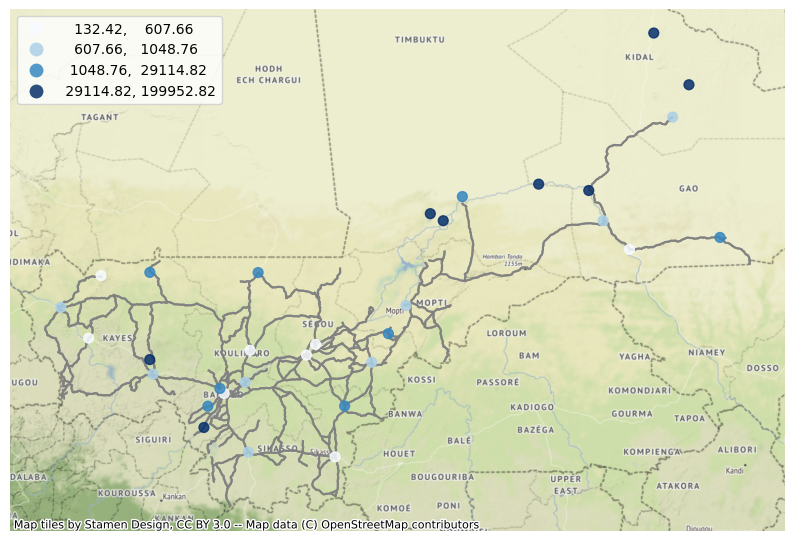

In [55]:
f, ax = plt.subplots(figsize=(10, 10))
gdf_edges.plot(ax=ax,markersize=50, alpha=0.85, color='grey', zorder=1)
cleangdfMalipop.plot(ax=ax,column='distance', markersize=50, alpha=0.85, figsize=(10,10), scheme='quantiles', k=4, legend=True, cmap='Blues',zorder=2)
ax.set_axis_off()
cx.add_basemap(ax, crs=cleangdfMalipop.crs.to_string())

plt.show()

TO DO: add a plot with lines from the cities to the corresponding nodes:
https://autogis-site.readthedocs.io/en/2019/notebooks/L3/nearest-neighbor-faster.html

In [185]:
for i in range(0, len(cleangdfMalipop)):
    folium.CircleMarker([cleangdfMalipop.iloc[i]['lat'], cleangdfMalipop.iloc[i]['lng']], radius=2, color="crimson", popup=cleangdfMalipop.iloc[i]['city']).add_to(map)
map

The cities that are too far from the road system and the nodes are deleted for now. 

In [60]:
df2 = cleangdfMalipop.loc[cleangdfMalipop["distance"] <= 29000 ]
df2

,city,lat,lng,admin_name,population,geometry,osmid,y,x,street_count,highway,closest_stop_geom,distance
0,Bamako,12.6458,-7.9922,Bamako,2009109.0,POINT (-7.99220 12.64580),323862926,12.645958,-7.994757,4,NaN,POINT (-7.99476 12.64596),284.824608
2,Sikasso,11.3167,-5.6667,Sikasso,213977.0,POINT (-5.66670 11.31670),2117186676,11.315714,-5.667374,3,NaN,POINT (-5.66737 11.31571),132.416182
3,Ségou,13.4500,-6.2667,Ségou,133501.0,POINT (-6.26670 13.45000),8493954406,13.446071,-6.268371,1,NaN,POINT (-6.26837 13.44607),472.401338
4,Mopti,14.4900,-4.1800,Mopti,108456.0,POINT (-4.18000 14.49000),1706414008,14.493090,-4.188592,3,NaN,POINT (-4.18859 14.49309),1015.012502
5,Koutiala,12.3833,-5.4667,Sikasso,104927.0,POINT (-5.46670 12.38330),383963131,12.392917,-5.464930,3,NaN,POINT (-5.46493 12.39292),1082.501598
6,Kayes,14.4500,-11.4167,Kayes,77207.0,POINT (-11.41670 14.45000),3158012224,14.441436,-11.419333,2,NaN,POINT (-11.41933 14.44144),978.262737
7,Kati,12.7504,-8.0800,Koulikoro,66895.0,POINT (-8.08000 12.75040),1634124450,12.740901,-8.068831,3,NaN,POINT (-8.06883 12.74090),1623.582725
8,Bougouni,11.4167,-7.4833,Sikasso,59679.0,POINT (-7.48330 11.41670),9605218258,11.423799,-7.480167,1,NaN,POINT (-7.48017 11.42380),856.671334
9,Markala,13.6739,-6.0750,Ségou,53738.0,POINT (-6.07500 13.67390),2109314025,13.678019,-6.075524,3,NaN,POINT (-6.07552 13.67802),459.107694
10,Gao,16.2667,-0.0500,Gao,49483.0,POINT (-0.05000 16.26670),2117788561,16.275263,-0.049789,3,NaN,POINT (-0.04979 16.27526),952.494459


In [92]:
#labelsdict = {} 

#fill the nodes with their populations
for i in range(0, len(cleangdfMalipop)):
    osmidnr = cleangdfMalipop.osmid[i]
    populationnr = cleangdfMalipop.population[i]
    nx.set_node_attributes(G, {osmidnr:osmidnr}, 'population')
    #label = cleangdfMalipop.city[i]
    #G.nodes[i]['population'] = population[i]

In [101]:
gdf_nodespop, gdf_edgespop = ox.graph_to_gdfs(G)

TO DO: Check why Bamako is small 

https://www.geeksforgeeks.org/directed-graphs-multigraphs-and-visualization-in-networkx/

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\mapclassify\classifiers.py:255: UserWarning: Not enough unique values in array to form 4 classes. Setting k to 2.
  warnings.warn(


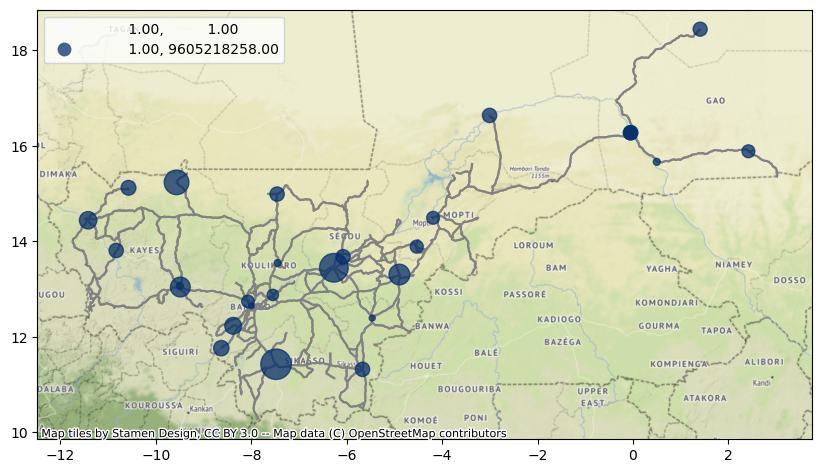

In [120]:
node_size = [0.00000005 * nx.get_node_attributes(G, 'population')[v] for v in G]

f, ax = plt.subplots(figsize=(10, 10))
gdf_edgespop.plot(ax=ax,markersize=50, alpha=0.85, color='grey', zorder=1)
#gdf_nodespop.plot(ax=ax,column='population', markersize=node_size, alpha=0.85, figsize=(10,10), scheme='quantiles', k=4, legend=True, cmap='Blues',zorder=2)
gdf_nodespop.plot(ax=ax,column='population', markersize=node_size, alpha=0.75, figsize=(10,10), scheme='quantiles', k=4, legend=True, cmap='Blues',zorder=2)

cx.add_basemap(ax, crs=gdf_nodespop.crs.to_string())

plt.show()

In [119]:
gdf_nodespop.loc[323862926]

y                                   12.645958
x                                   -7.994757
street_count                                4
population                          323862926
highway                                   NaN
geometry        POINT (-7.9947567 12.6459581)
Name: 323862926, dtype: object

In [121]:
G.nodes[323862926]

{'y': 12.6459581, 'x': -7.9947567, 'street_count': 4, 'population': 323862926}

---
### Weighted Cost Function

For now we use just the betweenneess and weights of cities

In [122]:
edge_betwcentrality = nx.betweenness_centrality(nx.line_graph(G))


In [123]:
edge_betwcentrality

{(504509824, 505824314, 0): 0.003297902615338794,
 (505824314, 504509824, 0): 0.004979236165089258,
 (505824314, 505824029, 0): 0.026258398435948533,
 (505824314, 2456393854, 0): 0.03272027168558375,
 (504509824, 2534916634, 0): 0.0054209307973260654,
 (2534916634, 8314434185, 0): 0.014122276511142924,
 (2534916634, 2456393854, 0): 0.0031712037585557885,
 (2534916634, 505824467, 0): 0.02167383612927071,
 (2534916634, 504509824, 0): 0.0037365949049978013,
 (2456393854, 505824314, 0): 0.023594975248182916,
 (2456393854, 2534916634, 0): 0.004845832076549171,
 (2456393854, 2148961095, 0): 0.028616187107520397,
 (2148961095, 2148961035, 0): 0.029246612032282234,
 (2148961095, 2456393854, 0): 0.021161015474245932,
 (2148961095, 8314434185, 0): 0.00010840467203106654,
 (8314434185, 2534916634, 0): 0.014449312140857875,
 (8314434185, 2148961035, 0): 0.014972377749062382,
 (8314434185, 2148961095, 0): 7.293190511896907e-05,
 (505824467, 2118115486, 0): 0.0004285844029804255,
 (505824467, 253491

TO DO: Edge betweenness centrality gives slightly different values. Need to choose one of the two

In [127]:
otheredgebetweenness = nx.edge_betweenness_centrality(G, k=None, normalized=True, weight=None, seed=None)


In [128]:
otheredgebetweenness

{(504509824, 505824314, 0): 0.0030506092812300546,
 (504509824, 2534916634, 0): 0.005406971478979687,
 (2456393854, 505824314, 0): 0.020159322613372666,
 (2456393854, 2534916634, 0): 0.004849662389683925,
 (2456393854, 2148961095, 0): 0.026440809826901307,
 (2534916634, 8314434185, 0): 0.011146396869161334,
 (2534916634, 2456393854, 0): 0.002889282668065785,
 (2534916634, 505824467, 0): 0.020409225827633517,
 (2534916634, 504509824, 0): 0.0034374468223652838,
 (2148961035, 2148961095, 0): 0.01810668023329869,
 (2148961035, 2159461048, 0): 0.03906734525325367,
 (2148961035, 8314434185, 0): 0.012693050373736418,
 (2148961095, 2148961035, 0): 0.02681985681904012,
 (2148961095, 2456393854, 0): 0.01770822720188532,
 (2148961095, 8314434185, 0): 7.025075683391462e-05,
 (8314434185, 2534916634, 0): 0.01219082324144728,
 (8314434185, 2148961035, 0): 0.011678895310027568,
 (8314434185, 2148961095, 0): 4.5412082908127275e-05,
 (504509190, 2159461048, 0): 0.03791176960855994,
 (504509190, 2159438

In [129]:
my_list = list(edge_betwcentrality.values())
my_list

[0.003297902615338794,
 0.004979236165089258,
 0.026258398435948533,
 0.03272027168558375,
 0.0054209307973260654,
 0.014122276511142924,
 0.0031712037585557885,
 0.02167383612927071,
 0.0037365949049978013,
 0.023594975248182916,
 0.004845832076549171,
 0.028616187107520397,
 0.029246612032282234,
 0.021161015474245932,
 0.00010840467203106654,
 0.014449312140857875,
 0.014972377749062382,
 7.293190511896907e-05,
 0.0004285844029804255,
 0.017981831604079124,
 0.020150522563861337,
 0.021822409652053166,
 0.045116164802154704,
 0.03703317537933265,
 0.03797451825699557,
 0.05429088301165693,
 0.015259437097998482,
 0.04236065958984074,
 0.06370870419455273,
 0.025431912681132273,
 0.06802150391705962,
 0.055449413291175795,
 0.09808757844810757,
 0.03603601400599737,
 0.06213202186186939,
 0.09441214241580276,
 0.041817248742121546,
 0.04967125283998654,
 0.0502781965139283,
 0.002973882695587119,
 0.0349114256670182,
 0.06479049728321198,
 0.02998868926767858,
 0.07929710652170581,
 

In [131]:
gdf_edgespop

osmid  \
u           v           key                                                      
504509824   505824314   0           [41268816, 214787226, 41269211, 214787218]   
            2534916634  0    [894523660, 630217423, 246447439, 246447443, 4...   
2456393854  505824314   0    [572191905, 572191906, 321956592, 321956593, 3...   
            2534916634  0                    [572191817, 572205562, 339539188]   
            2148961095  0    [582062498, 582062499, 582062302, 423677690, 5...   
...                                                                        ...   
10934163656 10934163644 0                             [1176934609, 1177989765]   
            10934163638 0                                           1176934610   
10934163665 10934163672 0                                           1176934609   
            10934163636 0                                           1176934611   
10934163672 10934163649 0                                           1176934609   

                               highway  oneway       reversed     length  \
u           v           key                                                
504509824   505824314   0      primary   False           True  48681.697   
            2534916634  0    secondary   False  [False, True]  53546.744   
2456393854  505824314   0        trunk   False          False  25790.558   
            2534916634  0        trunk   False           True  19797.290   
            2148961095  0    secondary   False  [False, True]  42692.201   
...                                ...     ...            ...        ...   
10934163656 10934163644 0        trunk    True          False     34.313   
            10934163638 0        trunk    True          False     49.446   
10934163665 10934163672 0        trunk    True          False     29.173   
            10934163636 0        trunk    True          False     49.562   
10934163672 10934163649 0        trunk    True          False      2.840   

                            bridge  \
u           v           key          
504509824   505824314   0      yes   
            2534916634  0      NaN   
2456393854  505824314   0      yes   
            2534916634  0      yes   
            2148961095  0      yes   
...                            ...   
10934163656 10934163644 0      NaN   
            10934163638 0      NaN   
10934163665 10934163672 0      NaN   
            10934163636 0      NaN   
10934163672 10934163649 0      NaN   

                                                                      geometry  \
u           v           key                                                      
504509824   505824314   0    LINESTRING (-6.91382 11.14585, -6.91359 11.153...   
            2534916634  0    LINESTRING (-6.91382 11.14585, -6.91070 11.146...   
2456393854  505824314   0    LINESTRING (-7.01985 11.40241, -7.02066 11.402...   
            2534916634  0    LINESTRING (-7.01985 11.40241, -7.01851 11.402...   
            2148961095  0    LINESTRING (-7.01985 11.40241, -7.01965 11.403...   
...                                                                        ...   
10934163656 10934163644 0    LINESTRING (-11.38855 14.45992, -11.38855 14.4...   
            10934163638 0    LINESTRING (-11.38855 14.45992, -11.38852 14.4...   
10934163665 10934163672 0    LINESTRING (-11.38875 14.46014, -11.38879 14.4...   
            10934163636 0    LINESTRING (-11.38875 14.46014, -11.38885 14.4...   
10934163672 10934163649 0    LINESTRING (-11.38894 14.45998, -11.38894 14.4...   

                              ref  \
u           v           key         
504509824   505824314   0     NaN   
            2534916634  0    RN30   
2456393854  505824314   0     RN7   
            2534916634  0     RN7   
            2148961095  0     NaN   
...                           ...   
10934163656 10934163644 0     NaN   
            10934163638 0     NaN   
10934163665 10934163672 0     NaN   
            10934163636 0     NaN   
10934163672

In [135]:
nx.set_edge_attributes(G, otheredgebetweenness, "edge_betweenness")

In [136]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)
gdf_edges

osmid  \
u           v           key                                                      
504509824   505824314   0           [41268816, 214787226, 41269211, 214787218]   
            2534916634  0    [894523660, 630217423, 246447439, 246447443, 4...   
2456393854  505824314   0    [572191905, 572191906, 321956592, 321956593, 3...   
            2534916634  0                    [572191817, 572205562, 339539188]   
            2148961095  0    [582062498, 582062499, 582062302, 423677690, 5...   
...                                                                        ...   
10934163656 10934163644 0                             [1176934609, 1177989765]   
            10934163638 0                                           1176934610   
10934163665 10934163672 0                                           1176934609   
            10934163636 0                                           1176934611   
10934163672 10934163649 0                                           1176934609   

                               highway  oneway       reversed     length  \
u           v           key                                                
504509824   505824314   0      primary   False           True  48681.697   
            2534916634  0    secondary   False  [False, True]  53546.744   
2456393854  505824314   0        trunk   False          False  25790.558   
            2534916634  0        trunk   False           True  19797.290   
            2148961095  0    secondary   False  [False, True]  42692.201   
...                                ...     ...            ...        ...   
10934163656 10934163644 0        trunk    True          False     34.313   
            10934163638 0        trunk    True          False     49.446   
10934163665 10934163672 0        trunk    True          False     29.173   
            10934163636 0        trunk    True          False     49.562   
10934163672 10934163649 0        trunk    True          False      2.840   

                            bridge  \
u           v           key          
504509824   505824314   0      yes   
            2534916634  0      NaN   
2456393854  505824314   0      yes   
            2534916634  0      yes   
            2148961095  0      yes   
...                            ...   
10934163656 10934163644 0      NaN   
            10934163638 0      NaN   
10934163665 10934163672 0      NaN   
            10934163636 0      NaN   
10934163672 10934163649 0      NaN   

                                                                      geometry  \
u           v           key                                                      
504509824   505824314   0    LINESTRING (-6.91382 11.14585, -6.91359 11.153...   
            2534916634  0    LINESTRING (-6.91382 11.14585, -6.91070 11.146...   
2456393854  505824314   0    LINESTRING (-7.01985 11.40241, -7.02066 11.402...   
            2534916634  0    LINESTRING (-7.01985 11.40241, -7.01851 11.402...   
            2148961095  0    LINESTRING (-7.01985 11.40241, -7.01965 11.403...   
...                                                                        ...   
10934163656 10934163644 0    LINESTRING (-11.38855 14.45992, -11.38855 14.4...   
            10934163638 0    LINESTRING (-11.38855 14.45992, -11.38852 14.4...   
10934163665 10934163672 0    LINESTRING (-11.38875 14.46014, -11.38879 14.4...   
            10934163636 0    LINESTRING (-11.38875 14.46014, -11.38885 14.4...   
10934163672 10934163649 0    LINESTRING (-11.38894 14.45998, -11.38894 14.4...   

                             edge_betweenness   ref  \
u           v           key                           
504509824   505824314   0            0.003051   NaN   
            2534916634  0            0.005407  RN30   
2456393854  505824314   0            0.020159   RN7   
            2534916634  0            0.004850   RN7   
            2148961095  0            0.026441   NaN   
...                                       ...   ...   
10934163656 109

In [217]:
blabla['IDnr'] = np.nan

In [223]:
for i in range(0, len(blabla)):
    string = 'id'
    blabla.IDnr[i] = (string+str(i))

C:\Users\maaik\AppData\Local\Temp\ipykernel_25948\434000353.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  blabla.IDnr[i] = (string+str(i))


In [168]:
betweennessM = blabla[['osmid','edge_betweenness']]
b = betweennessM

In [169]:
a = b.set_index('osmid')

In [172]:
c = b.T

In [181]:
a

,edge_betweenness
osmid,
"[41268816, 214787226, 41269211, 214787218]",0.003051
"[894523660, 630217423, 246447439, 246447443, 41268892]",0.005407
"[572191905, 572191906, 321956592, 321956593, 321956594, 321956595, 572205492, 339539188, 572205493]",0.020159
"[572191817, 572205562, 339539188]",0.004850
"[582062498, 582062499, 582062302, 423677690, 582062299, 582062300, 582062301, 237758942]",0.026441
...,...
"[1176934609, 1177989765]",0.000163
1176934610,0.032488
1176934609,0.021193


In [226]:
blabla.head()

,u,v,key,osmid,highway,oneway,reversed,length,bridge,geometry,edge_betweenness,ref,name,lanes,junction,maxspeed,access,width,IDnr
0,504509824,505824314,0,"[41268816, 214787226, 41269211, 214787218]",primary,False,True,48681.697,yes,"LINESTRING (-6.91382 11.14585, -6.91359 11.153...",0.003051,NaN,NaN,NaN,NaN,NaN,NaN,NaN,id0
1,504509824,2534916634,0,"[894523660, 630217423, 246447439, 246447443, 4...",secondary,False,"[False, True]",53546.744,NaN,"LINESTRING (-6.91382 11.14585, -6.91070 11.146...",0.005407,RN30,NaN,NaN,NaN,NaN,NaN,NaN,id1
2,2456393854,505824314,0,"[572191905, 572191906, 321956592, 321956593, 3...",trunk,False,False,25790.558,yes,"LINESTRING (-7.01985 11.40241, -7.02066 11.402...",0.020159,RN7,"[Route Trans-Sahélienne, TRoute rans-Sahélienne]",NaN,NaN,NaN,NaN,NaN,id2
3,2456393854,2534916634,0,"[572191817, 572205562, 339539188]",trunk,False,True,19797.290,yes,"LINESTRING (-7.01985 11.40241, -7.01851 11.402...",0.004850,RN7,Route Trans-Sahélienne,NaN,NaN,NaN,NaN,NaN,id3
4,2456393854,2148961095,0,"[582062498, 582062499, 582062302, 423677690, 5...",secondary,False,"[False, True]",42692.201,yes,"LINESTRING (-7.01985 11.40241, -7.01965 11.403...",0.026441,NaN,NaN,NaN,NaN,NaN,NaN,NaN,id4


In [241]:
emptymatrix = pd.DataFrame(np.zeros([2310, 2310])*np.nan)

#make a matrix with all the roads
for i in range(0, len(blabla)):
    criticality = blabla.edge_betweenness[i]
    emptymatrix.iloc[:,i] = - criticality
    emptymatrix.iloc[i,i] = criticality

---
### Speeds

In [24]:
#result=gdf_edges.apply(lambda x:list(x.values())).explode().unique()

result=gdf_edges['maxspeed'].explode().value_counts()
result

maxspeed
60    46
30    13
40    12
50     8
Name: count, dtype: int64

In [25]:
result=gdf_edges['ref'].explode().value_counts()
result

ref
RN6          141
RN7          110
RN3           79
RN27          66
RN1           54
            ... 
RR15;RR20      2
RR27           2
RN16;RN39      2
RN             1
RN 11          1
Name: count, Length: 70, dtype: int64

In [26]:
gdf_edges_maxspeed40 = gdf_edges.loc[gdf_edges['maxspeed']=='60']

In [27]:
gdf_edges_maxspeed40

osmid  \
u          v          key                                                      
8482114954 7878606905 0    [910750344, 910750345, 749858957, 271391273, 8...   
3157005671 6801210370 0                    [718321298, 725248263, 718321295]   
5708575807 3157005671 0                                            718321295   
5708576071 8041710663 0                                            850167195   
6745729947 6801210371 0                                            718318871   
6745729951 6801210368 0                                            718318871   
6801210368 6745729947 0                                            718318871   
           7920762890 0         [852235240, 852235241, 718320490, 725248264]   
6801210370 6745729951 0                                            718318871   
6801210371 6801210370 0                                            718318871   
           6804745160 0                    [725752253, 725248262, 310283055]   
6804745160 8041710653 0                                            725752253   
6804745164 6804745158 0                    [725752251, 726015708, 726015709]   
6804784714 5708575807 0                    [718321296, 863245222, 718321295]   
6804784715 6804745164 0                    [725752252, 726015709, 863245223]   
8041710653 6804784715 0                    [863245224, 725752253, 863245223]   
8041710663 6804784714 0                    [718321296, 850167195, 310283054]   
1319247370 1994941420 0                               [849263117, 669894309]   
           5354965927 0    [849724690, 849724692, 849724693, 572213913, 5...   
1994941420 1994941603 0                               [237302508, 849263117]   
           1319247370 0                               [849263117, 669894309]   
1994941558 4423731629 0                                            237302508   
           1994941603 0                                            237302508   
1994941603 1994941558 0                                            237302508   
           1994941420 0                               [237302508, 849263117]   
2244274500 6801210382 0                                            725238381   
           4423731629 0    [848934216, 237302508, 275728372, 275728374, 8...   
4423731629 1994941558 0                                            237302508   
           2244274500 0    [848934216, 237302508, 275728372, 275728374, 8...   
5354965927 1319247370 0    [849724690, 849724692, 849724693, 572213913, 5...   
           7878606905 0    [572213903, 572213904, 572213905, 572213906, 5...   
6801210382 7920762902 0                                            725248266   
7878606905 5354965927 0    [572213903, 572213904, 572213905, 572213906, 5...   
           2527959214 0    [572213889, 572213890, 572213891, 572213892, 5...   
           8482114954 0    [910750344, 910750345, 749858957, 848331689, 8...   
7920762890 7920762903 0                               [725248264, 725238380]   
7920762902 6745729947 0         [725248266, 852235238, 718320494, 852235239]   
7920762903 2244274500 0                                            725238380   
2527959214 7878606905 0    [572213889, 572213890, 572213891, 572213892, 5...   
3157005665 5708576071 0                    [310283056, 726015707, 850167195]   
6804745158 6804784691 0                                            725752251   
6804784691 6804977954 0    [725778531, 725778532, 725783153, 726015704, 7...   
6804784693 3157005665 0                                            310283056   
6804977953 6804784693 0    [725783150, 310283056, 852269298, 726015702, 7...   

                             highway  oneway       reversed      length  \
u          v          key                                                 
8482114954 7878606905 0    secondary   False  [False, True]  160570.490   
3157005671 6801210370 0      primary    True          False    3497.717   
5708575807 3157005671 0      primary    True          False      98.299   
5708576071 8041

In [28]:
gdf_edges.isna().sum()

osmid          0
highway        0
oneway         0
reversed       0
length         0
bridge      1806
geometry       0
ref         1296
name        1664
lanes       2061
junction    1999
maxspeed    2236
access      2305
width       2296
dtype: int64

TO DO: Map of speeds

In [ ]:
ec = ox.plot.get_edge_colors_by_attr(G, 'maxspeed', cmap='plasma')
fig, ax = ox.plot_graph(G, node_alpha=0.1, edge_color=ec)

----

### https://docs.momepy.org/en/stable/user_guide/graph/centrality.html

In [24]:
streets_graph = ox.projection.project_graph(G)

In [25]:
edges = ox.graph_to_gdfs(ox.get_undirected(streets_graph), nodes=False, edges=True,
                                   node_geometry=False, fill_edge_geometry=True)

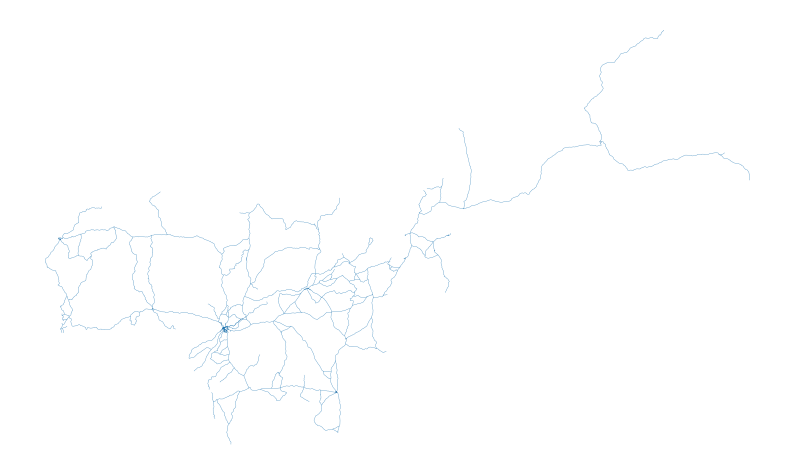

In [28]:
f, ax = plt.subplots(figsize=(10, 10))
edges.plot(ax=ax, linewidth=0.2)
ax.set_axis_off()
plt.show()

In [29]:
#primal graphs
primal = momepy.gdf_to_nx(edges, approach='primal')


NameError: name 'momepy' is not defined

---

In [ ]:
cf = '["highway"~"motorway|motorway_link|trunk|trunk_link"]'
Q = ox.graph_from_place("Mali", network_type="drive", custom_filter=cf)
fig, ax = ox.plot_graph(G)

In [ ]:
fig, ax = ox.plot_graph(M)

Primary and secondary highways

In [ ]:
M = ox.graph_from_place("Mali", network_type="drive", custom_filter='["highway"~"primary|secondary"]')
fig, ax = ox.plot_graph(M)

In [ ]:
ox.save_graphml(M, './data/Mali_primary_secondary.graphml')

In [ ]:
G2 = ox.load_graphml('./data/Mali_primary_secondary.graphml')
fig, ax = ox.plot_graph(G2)

In [ ]:
ox.folium.plot_graph_folium(G2)

Primary highway

In [ ]:
H = ox.graph_from_place("Mali", network_type="drive", custom_filter='["highway"~"primary"]')
fig, ax = ox.plot_graph(H)

In [ ]:
ox.folium.plot_graph_folium(H)

In [ ]:
ox.save_graphml(H, './data/Mali_primary.graphml')

Do the motorways and trunk stuff again

Do a graph of all primary, secondary and motorways and trunk stuff

In [ ]:
cf = '["highway"~"motorway|motorway_link|trunk|trunk_link|primary|secondary"]'
F = ox.graph_from_place("Mali", network_type="drive", custom_filter=cf)
fig, ax = ox.plot_graph(F)


In [ ]:
ox.folium.plot_graph_folium(F)